# Astrid Annisa Purwaningtyas - 2006485913


In [ ]:
%pip install watermark
import watermark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%load_ext watermark

# **1. Menyiapkan Workspace**

## Install Library

In [ ]:
import os, random, time, copy
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Menurunkan reporting level dari Tensorflow Warnings 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
from tensorflow.config import list_physical_devices
from tensorflow.image import resize

# Keras
from tensorflow.keras.utils import image_dataset_from_directory, img_to_array
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras import Sequential, Model, Input, layers, optimizers, losses, callbacks
from tensorflow.keras.models import load_model

### Penjelasan Kegunaan Library:

* **os**: Menyediakan cara untuk berinteraksi dengan OS, seperti mengakses sistem file atau variabel yang ada di system environment
* **random**: Menyediakan fungsi untuk membuat angka-angka dan sekuens random
* **time**: Menyediakan fungsi yang bekerja terkait dengan waktu, seperti *elapsed time*
* **copy**: Menyediakan fungsi untuk membuat *copy* dari suatu object
* **matplotlib.pyplot**: Menyediakan antarmuka untuk plotting sebagai cara untuk melakukan visualisasi
* **numpy**: Menyediakan cara untuk melakukan komputasi numerik, seperti komputasi pada array atau matrix
* **PIL.Image**: Menyediakan fungsi yang bekerja pada gambar
* **tensorflow**: Merupakan library yang digunakan untuk membuat dan melatih neural network pada deep learning
* **tensorflow.config.list_physical_devices**: Merupakan fungsi yang dapat membuat list dari alat-alat fisik yang dapat digunakan untuk tensorflow
* **tensorflow.image.resize**: Fungsi yang digunakan untuk resize image
* **tensorflow.keras.utils.image_dataset_from_directory**: Fungsi yang membuat Tensorflow tf.data.Dataset dari file gambar yang ada di direktori
* **tensorflow.keras.utils.img_to_array**: Fungsi yang dapat melakukan konversi dari gambar ke Numpy Array 
* **tensorflow.keras.applications.resnet50.ResNet50**: Sebuah model prerained neural network untuk klasifikasi gambar
* **tensorflow.keras**: API Keras untuk melakukan building dan training model
* **tensorflow.keras.Sequential**: Fungsi untuk membuat model sekuensial
* **tensorflow.keras.Model**: Fungsi untuk membuat model custom
* **tensorflow.keras.Input**: Fungsi untuk mendefinisikan layer input
* **tensorflow.keras.layers**: Modul yang memiliki berbagai macam jenis layer, seperti: Dense, Conv2D, dan MaxPooling2D
* **tensorflow.keras.optimizers**: Modul yang memiliki berbagai macam optimizer class, seperti: Adam, SGD, dan RMSprop.
* **tensorflow.keras.losses**: Modul yang memiliki berbagai macam loss function, seperi: BinaryCrossentropy, CategoricalCrossentropy, dan MeanSquaredError
* **tensorflow.keras.callbacks**: Modul yang memiliki beberapa callback classes, seperti ModelCheckpoint, EarlyStopping, dan ReduceLROnPlateau
* **tensorflow.keras.models.load_model**: Fungsi yang dapat load Keras model yang sudah disimpan di disk

## Pengecekan

**-> Cek apakah ada GPU atau tidak**

In [ ]:
# Cek Ketersediaan GPU
print("GPU", "available" if list_physical_devices("GPU") else "not available")

GPU available


**-> Cek Versi Library yang digunakan**

In [ ]:
import sys
# sys module, which provides access to some variables and functions used or 
# maintained by the interpreter, and is commonly used to manipulate the Python runtime environment.

import matplotlib
# matplotlib module, which is a data visualization library in Python. 
# matplotlib provides a variety of visualization tools and is used to create plots, charts, and other visualizations.

print(f'Python: {sys.version}')
print(f'Matplotlib: {matplotlib.__version__}')
print(f'NumPy: {np.__version__}')
print(f'TensorFlow: {tf.__version__}')
print(f'Keras: {tf.keras.__version__}')

Python: 3.9.16 (main, Dec  7 2022, 01:11:51) 
[GCC 9.4.0]
Matplotlib: 3.7.1
NumPy: 1.22.4
TensorFlow: 2.12.0
Keras: 2.12.0


# **2. Load dan Mencari Data di Path**

## Mount dan Menyimpan Direktori GDrive

In [ ]:
# Mount GDrive
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Data folder path
data_path = "/content/drive/MyDrive/MedClass/"


In [ ]:
train_data_path = os.path.join(data_path, 'train')
validation_data_path = os.path.join(data_path, 'valid')

# Path ke masing-masing direktori
drugs_paths = [os.path.join(train_data_path, dir) 
                  for dir in os.listdir(train_data_path)]

# Menghilangkan Path atau Direktori kosong
for item in list(drugs_paths):  
    if not os.path.isdir(item) or len(os.listdir(item)) == 0:
        drugs_paths.remove(item)

# Membuat list Drug Label berdasarkan nama folder
drugs_labels = [path.split('/')[-1] for path in drugs_paths]


### Penjelasan

* **train_data_path**, path dari folder yang memiliki data yang akan di-train
* **validation_data_path**, path dari folder yang memiliki data yang akan dijadikan validasi
* **drugs_paths**, variabel yang memiliki path lists dari masing folder obat pada folder training. Dimana ini didapatkan dengan menggabungkan train_data_path dengan nama dari masing folder obat di train_data_path dengan menggunakan **os.path.join()**
* **drugs_labels**, variabel yang memiliki list dari nama-nama drug yang diekstraksi dari path yang ada di drugs_paths. Hal ini dilakukan dengan memisahkan path di drug_paths pada '/' dan mengambil elemen terakhirnya,

Menghilangkan path atau direktori kosong dari drug_paths dilakukan dengan menggunakan **for**-**loop**, **os.path.isdir()**, dan **os.listdir()**. Loop ini akan melakukan iterasi pada setiap copy dari list yang ada di drug_paths. Ketika direktori atau pathnya kosong, maka direktori atau pathnya dihapus dari drugs_paths

## Menampilkan Gambar Representatif dari masing-masing class

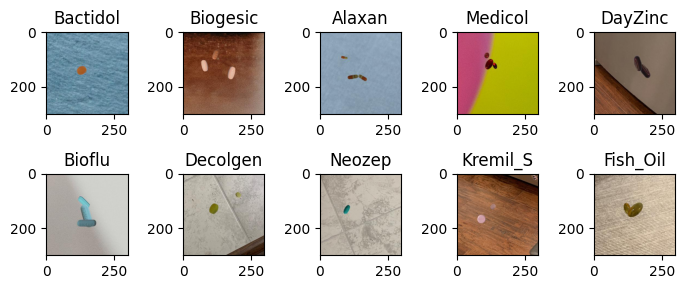

In [ ]:
# Membuat list gambar secara random, yang akan ditampilkan (sebagai gambar sampel)
random_drugs = [Image.open(os.path.join(path, random.choice(os.listdir(path)))) 
                   for path in drugs_paths]

# Membuat representasi gambar dari masing-masing obat
plt.figure(figsize=(7, 7))

for i in range(10):
    # Membuat subplots (2 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Menampilkan gambar
    plt.imshow(random_drugs[i])
    # Menambahkan label gambar
    plt.title(drugs_labels[i])

# Membuat layout yang padat
plt.tight_layout(h_pad=1)

### Penjelasan

* **random_drugs**, merupakan variabel yang menyimpan list dari gambar random dari masing-masing drug. Hal ini dapat dilakukan dengan membuka gambar dengan **Image.open()** pada masing-masing folder yang ada pada **drugs_paths**. Hal ini dilakukan dengan menambahkan path dari folder drug dengan nama file yang ada pada folder tersebut dengan menggunakan **os.path.join()** dan **os.listdir()**. Path dari file random ini lalu ditambahkan ke list di **random_drugs**

Kode selanjutnya digunakan untuk membuat gambar berukuran 7x7 Inci menggunakan **plt.figure()**. Kemudian For-Loop dilakukan untuk melakukan iterasi dan membuat subplot secara berulang untuk setiap gambar dengan **plt.subplot()**. Subplot dibuat dengan grid 2x5 (2 baris, 5 kolom), dengan setiap subplot diposisikan tepat setelah subplot setelahnya (i+1).

* **plt.imshow()**, digunakan untuk menampilkan gambar.
* **Plt.title()**, akan menambahkan title pada setiap gambar. Title yang digunakan adalah nama dari drug yang disimpan di drugs_labels
* **plt.tight_layout()**, digunakan untuk menyesuaikan jarak antara subplot. Dimana parameter **h_pad** mengatur padding antar baris pada subplot.

# **3. Membuat Dataset & Augmentasi Data**

## Membuat Dataset Training & Validation

In [ ]:
batch_size = 32
image_size = (224,224)

image_datasets = {
    'train': image_dataset_from_directory(
        directory=train_data_path,
        batch_size=batch_size,
        image_size=image_size,
        shuffle=True),

    'validation': image_dataset_from_directory(
        directory=validation_data_path,
        batch_size=batch_size,
        image_size=image_size,
        shuffle=False)
}

print()

Found 5109 files belonging to 10 classes.
Found 5010 files belonging to 10 classes.



### Penjelasan

Kode ini akan membuat dataset (train & validation), menggunakan fungsi **image_dataset_from_directory** yang tersedia di Keras

Seperti yang dijelaskan di atas **train_data_path** dan **validation_data_path** punya direktori dimana masing-masing dataset disimpan
 
* **batch_size**, variabel yang menentukan jumlah gambar yang diload dalam satu waktu selama proses training atau validation. Semakin kecil **batch_size**, mungkin semakin baik untuk device yang punya resource minim, tetapi semakin besar **batch_size** mampu meningkatkan kecepatan proses training

* **image_size**, variabel yang menentukan ukuran dari gambar yang di load. Variabel ini penting untuk dibuat, supaya proses pembelajaran lebih konsisten (ukuran gambar yang sama di setiap kali training)

* **shuffle**, merupakan parameter yang digunakan untuk mengacakan urutan gambar yang akan ditraining untuk mencegah overfitting

**image_datasets** akan menjadi varibel dictionary yang punya 2 keys, yaitu '*train*' dan '*validation*', dimana masing-masing memiliki value yang merupakan objek dataset tensorflow, yang dapat digunakan untuk training dan validation di ML model.


## Augmentasi Data

In [ ]:
# Augmentasi Data
data_augmentation = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomFlip('vertical'),
    layers.RandomRotation(0.2),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2),
    # layers.RandomZoom(0.2),
    # layers.RandomCrop(height, width),
])


### Penjelasan

Augmentasi data adalah transformasi yang akan dilakukan pada data input. Transformasi ini dilakukan untuk meningkatkan kemampuan model untuk melakukan generalisasi data dan membuat data lebih diverse. 

* RandomFlip, akan secara random membuat gambar ter-flip secara baik secara horizontal maupun vertikal
* RandomRotation, akan membuat data berotasi secara random, dengan value maksimal dapat diinput dalam bentuk radian
* RandomContrast, akan merubah kontras secara random
* RandomBrightness, akan merubah brightness secara random 

## Disable Warnings & Pengaplikasian Augmentasi Data dan Preprocessing Model

In [ ]:
# Disable beberapa warnings dari Tensorflow (Jika tidak ada GPU)
tf.get_logger().setLevel('ERROR')

# Mengaplikasikan augmentasi data pada data training
image_datasets['train'] = image_datasets['train'].map(
    lambda x, y: (data_augmentation(x), y))

# Mengaplikasikan model preprocessing pada dataset
AUTOTUNE = tf.data.AUTOTUNE
for subset in ['train', 'validation']:
    image_datasets[subset] = image_datasets[subset].map(
        lambda x, y: (preprocess_input(x), y),
        num_parallel_calls=AUTOTUNE)

### Penjelasan

* **tf.get_logger()**, Mendapatkan log dari tensorflow
* **setLevel('ERROR')**, Menetapkan jika log yang diterima hanya menampilkan 'ERROR' saja, dan bukan warning. Hal ini dilakukan untuk menghilangkan warning yang muncul jika dijalankan di device yang tidak memiliki GPU (tetapi Gdrive punya GPU)

Kode selanjutnya akan mengaplikasikan data augmentasi pada dataset training. Dimana:
* **map()**, merupakan fungsi yang digunakan untuk mengaplikasikan fungsi lainnya pada setiap elemen dari dataset.
* **lambda x,y : (data_augmentation(x), y)**, adalah fungsi yang diaplikasikan tersebut, dimana x adalah gambar input dan y adalah label dari gambar tersebut

Sebelum dilakukan preprocessing, variabel **AUTOTUNE** dibuat yang nantinya akan digunakan untuk memberitahukan seberapa banyak "pekerjaan" yang dapat dilakukan komputer dalam satu waktu secara otomatis, dan melalukan optimisasi resource yang ada. 

Selanjutnya preprocessing akan dilakukan sebelum dataset gambar benar-benar dipelajari menggunakan pretrained model ResNet terlebih dahulu. **preprocess_input** ini menggunakan fungsi yang sudah ada pada ResNet50. Pada proses preprocessing ini juga autotune diaplikasikan


# **4. Membuat Model dengan Pretrained model (ResNet50)**

## Initialisasi penggunaan ResNet50 sebagai Base Model

In [ ]:
# Load ResNet50 model
base_model = ResNet50(
    # Cut off model's head
    include_top=False,
    # Set weight
    weights='imagenet')

# Freeze weight dari base_model (ResNet50)
for layer in base_model.layers:
    layer.trainable = False

94765736/94765736 [==============================] - 1s 0us/step


### Penjelasan

Kode ini membuat variabel inisialisasi penggunaan ResNet50 sebagai base model, dimana:
* **include_top**, merupakan argumen yang menentukan apakah kita akan menggunakan layer terakhir dari ResNet50 atau tidak. Layer terakhir sendiri adalah layer klasifikasi, dan karena kita menambahkan klasifikasi sendiri dan bukan dari ResNet50, maka kita buat ini *false* atau layer-nya tidak digunakan.
* **weights**, merupakan parameter yang digunakan untuk training. Dimana di sini, weights yang digunakan pada base_model atau ResNet sendiri adalah weight yang digunakan pada ImageNet dataset. 

## Penambahan Beberapa Layer terakhir (bukan dari ResNet50)

In [ ]:
# Mendapatkan jumlah Class yang akan diprediksi dari jumlah drug label
num_classes = len(drugs_labels)

# Konstruksi model tambahan
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

# Koneksikan base_model (ResNet50) dengan model tambahan
model_adam = Model(base_model.inputs, outputs)
model_adadelta = Model(base_model.inputs, outputs)
model_adagrad = Model(base_model.inputs, outputs)

### Penjelasan

* **num_classes = len(drugs_labels)** : Digunakan untuk mendapatkan jumlah class yang akan diprediksi. Dimana hal ini didapatkan dengan menggunakan fungsi **len()** yang menghitung total element di list atau array, dan pada kasus ini adalah array dari nama-nama obat di variabel **drug_labels**
* **x = base_model.output** : Digunakan untuk membuat variabel x yang diassign base_model, dimana **base_model** adalah ResNet50 (sudah dijelaskan sebelumnya).
* **x = layers.GlobalAveragePooling2D()(x)**: Baris ini digunakan untuk mengaplikasikan layer GlobalAveragePooling2D, dimana ini adalah teknik untuk mengambil informasi dari **feature map** sekaligus mengurangi dimensinya dengan membuat rata dari setiap beberapa baris dan kolom. **feature map** adalah representasi gambar yang dilihat oleh mesin, yaitu berupa angka.
* **x = layers.Dense(128, activation='relu')(x)** : Baris ini digunakan untuk membuat **dense layer** dengan 128 neuron dan ReLU sebagai fungsi aktivasinya. **dense layer** adalah layer neural network yang terhubung antar neuronnya ke layer sebelumnya, dimana jumlahnya menyesuaikan fitur yang akan dipelajarinya. **ReLU (Rectified Linear Unit)** merupakan fungsi aktivasi yang akan menerima input hanya 0 atau lebih dari 0, ketikan negatif, maka ReLu akan membuat input ini menjadi 0. 
* **model = Model(base_model.inputs, outputs)** : Baris ini akan menghubungkan base_model dengan model tambahan yang sudah dibuat sebelumnya.

## Kompilasi Model, Pengaturan Optimizer dan Loss Function

In [ ]:
# Set optimizer dan loss function 
optimizer_adam = optimizers.Adam()
optimizer_adadelta = optimizers.Adadelta()
optimizer_adagrad = optimizers.Adagrad()

loss = losses.SparseCategoricalCrossentropy()

# Compile model

model_adam.compile(optimizer=optimizer_adam,
              loss=loss,
              metrics=['accuracy'])
model_adadelta.compile(optimizer=optimizer_adadelta,
              loss=loss,
              metrics=['accuracy'])
model_adagrad.compile(optimizer=optimizer_adagrad,
              loss=loss,
              metrics=['accuracy'])

### Penjelasan

**optimizer** adalah algoritma yang menyesuaikan weights yang digunakan selama training, dan digunakan untuk mengurangi loss function. Dimana **optimizer** ini akan digunakan secara keseluruhan, tetapi ResNet50 tidak dirubah weightnya karena sudah standard, 

**Loss function** adalah cara untuk menentukan seberapa baik model telah belajar

**model.compile** , digunakan untuk melakukan kompilasi dari beberapa hal yang sudah dibuat sebelumnya, seperti optimizer, loss function, dan accuracy metric

# **5. Train dan Evaluasi Model**

## Melakukan Earlystopping

In [ ]:
earlystopping = callbacks.EarlyStopping(monitor ="val_accuracy", 
                                        mode ="max", patience = 3, 
                                        restore_best_weights = True)

### Penjelasan

Early Stopping akan melakukan monitoring terhadap performa, tergantung performa apa yang akan di monitor, dan akan memberhentikan proses training ketika apa yang dimonitor tidak mengalami peningkatan

Paramater yang digunakan adalah:
* **monitor**, akan menentukan performa apa yang akan dimonitor
* **mode**, akan menspesifikasikan kuantitas dari performa yang dimonitor, di sini dibuat "max" karena kita ingin mendapatkan validation accuracy yang paling tinggi
* **patience**, adalah jumlah epoch yang tidak mengalami peningkatan validation accuracy sebelum earlystopping dilakukan
* **restore_best_weights**, akan melakukan pengambilan dan penggunaan weights yang paling optimal sebelum training dihentikan 

## Implementasi Training ML Model

In [ ]:
epochs = 10

history_adagrad = model_adagrad.fit(
    image_datasets['train'],
    validation_data=image_datasets['validation'],
    epochs=epochs,
    callbacks=[earlystopping]
)

Epoch 1/10
160/160 [==============================] - 1070s 6s/step - loss: 2.0043 - accuracy: 0.3136 - val_loss: 1.5511 - val_accuracy: 0.5148
Epoch 2/10
160/160 [==============================] - 98s 610ms/step - loss: 1.3950 - accuracy: 0.5755 - val_loss: 1.1878 - val_accuracy: 0.6447
Epoch 3/10
160/160 [==============================] - 81s 500ms/step - loss: 1.1377 - accuracy: 0.6686 - val_loss: 0.9996 - val_accuracy: 0.7076
Epoch 4/10
160/160 [==============================] - 99s 616ms/step - loss: 0.9830 - accuracy: 0.7162 - val_loss: 0.8851 - val_accuracy: 0.7417
Epoch 5/10
160/160 [==============================] - 100s 623ms/step - loss: 0.8851 - accuracy: 0.7424 - val_loss: 0.8106 - val_accuracy: 0.7601
Epoch 6/10
160/160 [==============================] - 98s 612ms/step - loss: 0.8094 - accuracy: 0.7616 - val_loss: 0.7604 - val_accuracy: 0.7752
Epoch 7/10
160/160 [==============================] - 98s 608ms/step - loss: 0.7608 - accuracy: 0.7843 - val_loss: 0.7181 - val_ac

In [ ]:
epochs = 10

history_adadelta = model_adadelta.fit(
    image_datasets['train'],
    validation_data=image_datasets['validation'],
    epochs=epochs,
    callbacks=[earlystopping]
)

Epoch 1/10
160/160 [==============================] - 102s 615ms/step - loss: 0.6228 - accuracy: 0.8268 - val_loss: 0.6338 - val_accuracy: 0.8068
Epoch 2/10
160/160 [==============================] - 79s 492ms/step - loss: 0.6302 - accuracy: 0.8203 - val_loss: 0.6322 - val_accuracy: 0.8090
Epoch 3/10
160/160 [==============================] - 98s 608ms/step - loss: 0.6211 - accuracy: 0.8205 - val_loss: 0.6307 - val_accuracy: 0.8094
Epoch 4/10
160/160 [==============================] - 100s 623ms/step - loss: 0.6268 - accuracy: 0.8168 - val_loss: 0.6293 - val_accuracy: 0.8098
Epoch 5/10
160/160 [==============================] - 99s 615ms/step - loss: 0.6310 - accuracy: 0.8168 - val_loss: 0.6283 - val_accuracy: 0.8100
Epoch 6/10
160/160 [==============================] - 80s 496ms/step - loss: 0.6163 - accuracy: 0.8221 - val_loss: 0.6271 - val_accuracy: 0.8098
Epoch 7/10
160/160 [==============================] - 80s 495ms/step - loss: 0.6244 - accuracy: 0.8238 - val_loss: 0.6259 - val_

In [ ]:
epochs = 10

history_adam = model_adam.fit(
    image_datasets['train'],
    validation_data=image_datasets['validation'],
    epochs=epochs,
    callbacks=[earlystopping]
)

Epoch 1/10
160/160 [==============================] - 102s 610ms/step - loss: 0.6908 - accuracy: 0.7735 - val_loss: 0.4836 - val_accuracy: 0.8421
Epoch 2/10
160/160 [==============================] - 79s 493ms/step - loss: 0.4604 - accuracy: 0.8411 - val_loss: 0.4440 - val_accuracy: 0.8555
Epoch 3/10
160/160 [==============================] - 81s 504ms/step - loss: 0.3908 - accuracy: 0.8661 - val_loss: 0.4133 - val_accuracy: 0.8613
Epoch 4/10
160/160 [==============================] - 76s 474ms/step - loss: 0.3318 - accuracy: 0.8843 - val_loss: 0.3831 - val_accuracy: 0.8760
Epoch 5/10
160/160 [==============================] - 99s 617ms/step - loss: 0.3072 - accuracy: 0.8910 - val_loss: 0.3968 - val_accuracy: 0.8699
Epoch 6/10
160/160 [==============================] - 79s 490ms/step - loss: 0.2895 - accuracy: 0.8947 - val_loss: 0.3704 - val_accuracy: 0.8774
Epoch 7/10
160/160 [==============================] - 96s 595ms/step - loss: 0.2624 - accuracy: 0.9113 - val_loss: 0.3515 - val_a

### Penjelasan

Pada kode ini, model akan di-train dengan menggunakan **fit()**. Pada **fit()** ini, akan ada beberapa parameter yang digunakan, yaitu:

* **epochs** , variabel jumlah berapa kali pengulangan pembelajaran keseluruhan dataset. Disini kita setting 10 kali pengulangan
* **image_datasets['train']**, akan digunakan untuk men-spesifikasikan data akan di-train
* **validation_data=image_datasets['validation']**, akan menspesifikasikan data yang digunakan sebagai validasi atau evaluasi model setelah setiap epoch
* **callbacks**, merupakan parameter yang memiliki beberapa fungsi yang dapat dilakukan pada tahap tertentu di prosedur training. Pada kode ini, kita menggunakan callbakcks untuk menggunakan **earlystopping**. earlystopping akan menghentikan training, jika validation accuracy-nya tidak meningkat 

## Melakukan plotting learning curves

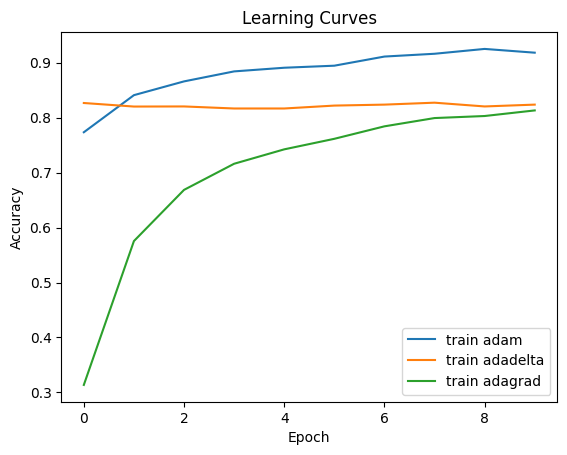

In [ ]:
from matplotlib import pyplot

# plot learning curves
pyplot.title('Learning Curves')
pyplot.xlabel('Epoch')
pyplot.ylabel('Accuracy')

pyplot.plot(history_adam.history['accuracy'], label='train adam')
pyplot.plot(history_adadelta.history['accuracy'], label='train adadelta')
pyplot.plot(history_adagrad.history['accuracy'], label='train adagrad')

pyplot.legend()
pyplot.show()

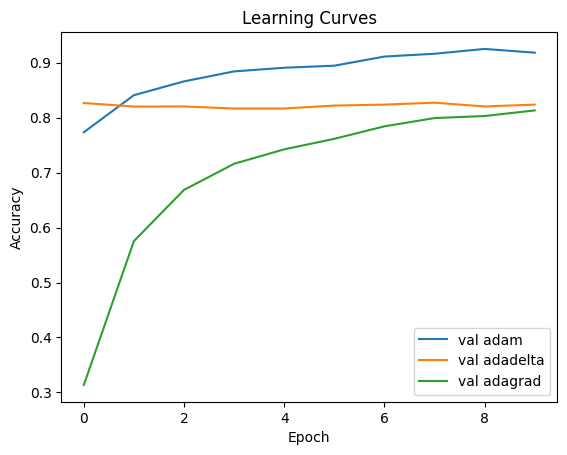

In [ ]:
from matplotlib import pyplot

# plot learning curves
pyplot.title('Learning Curves')
pyplot.xlabel('Epoch')
pyplot.ylabel('Accuracy')

pyplot.plot(history_adam.history['accuracy'], label='val adam')
pyplot.plot(history_adadelta.history['accuracy'], label='val adadelta')
pyplot.plot(history_adagrad.history['accuracy'], label='val adagrad')

pyplot.legend()
pyplot.show()

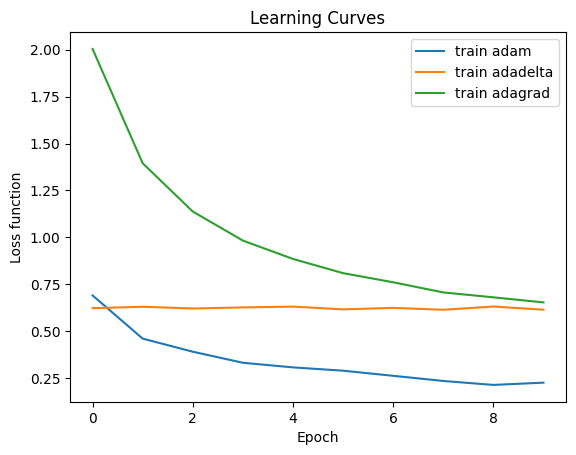

In [ ]:
from matplotlib import pyplot

# plot learning curves
pyplot.title('Learning Curves')
pyplot.xlabel('Epoch')
pyplot.ylabel('Loss function')

pyplot.plot(history_adam.history['loss'], label='train adam')
pyplot.plot(history_adadelta.history['loss'], label='train adadelta')
pyplot.plot(history_adagrad.history['loss'], label='train adagrad')

pyplot.legend()
pyplot.show()

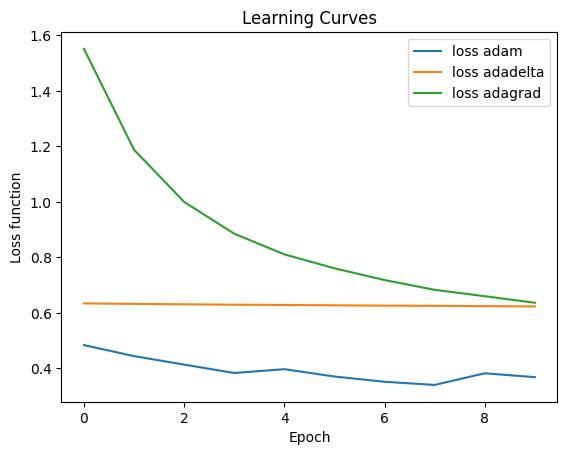

In [ ]:
from matplotlib import pyplot

# plot learning curves
pyplot.title('Learning Curves')
pyplot.xlabel('Epoch')
pyplot.ylabel('Loss function')

pyplot.plot(history_adam.history['val_loss'], label='loss adam')
pyplot.plot(history_adadelta.history['val_loss'], label='loss adadelta')
pyplot.plot(history_adagrad.history['val_loss'], label='loss adagrad')

pyplot.legend()
pyplot.show()

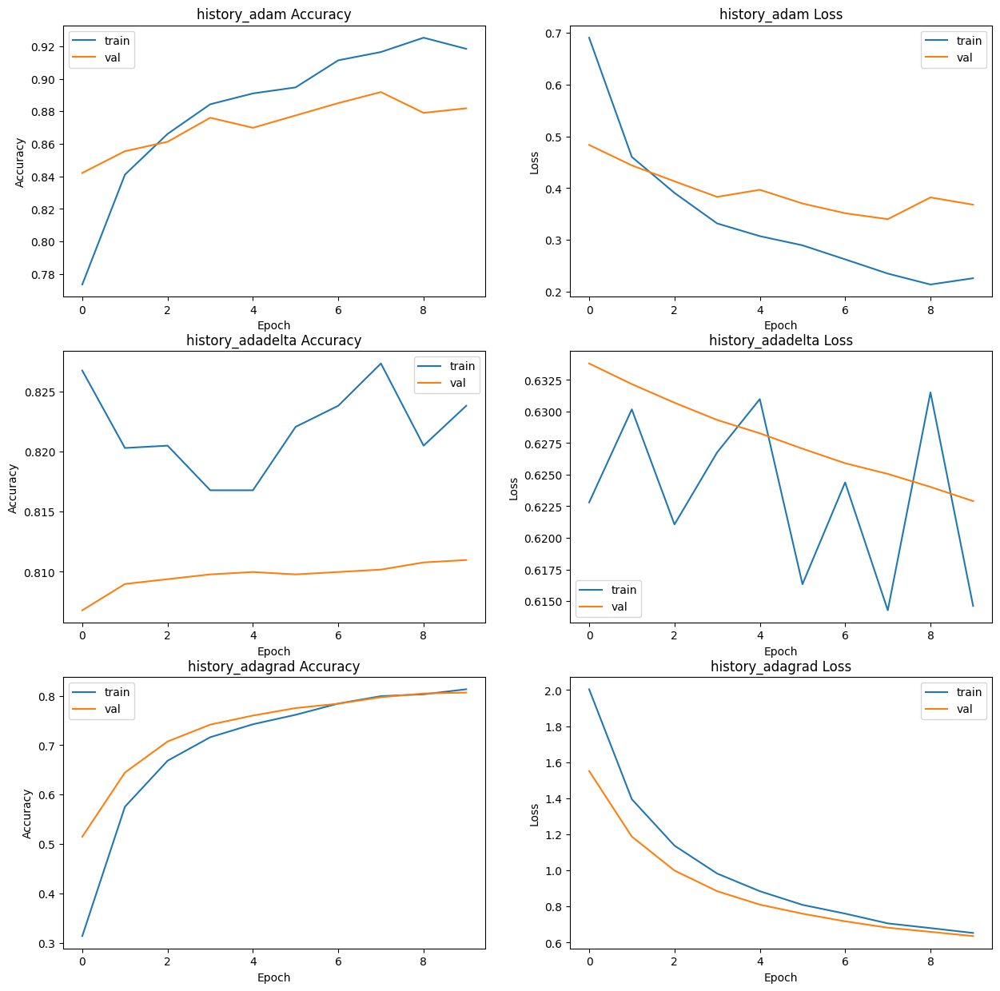

In [ ]:
history = [history_adam, history_adadelta, history_adagrad]
history2 = ["history_adam","history_adadelta","history_adagrad"]
# create a figure with 3 rows and 2 columns
fig, axs = pyplot.subplots(3, 2, figsize=(15,15))

# plot learning curves for accuracy and loss function
for i in range(3):
    axs[i][0].plot(history[i].history['accuracy'], label='train')
    axs[i][0].plot(history[i].history['val_accuracy'], label='val')
    axs[i][0].set_title(history2[i] + ' Accuracy')
    axs[i][0].set_xlabel('Epoch')
    axs[i][0].set_ylabel('Accuracy')
    axs[i][0].legend()

    axs[i][1].plot(history[i].history['loss'], label='train')
    axs[i][1].plot(history[i].history['val_loss'], label='val')
    axs[i][1].set_title(history2[i] + ' Loss')
    axs[i][1].set_xlabel('Epoch')
    axs[i][1].set_ylabel('Loss')
    axs[i][1].legend()

pyplot.show()

### Penjelasan

Kode di atas, keduanya sama, yaitu digunakan untuk melakukan plotting. Pada plotting pertama, yang dilihat adalah 'accuracy' dan 'validation accuracy' per epoch. 
* **history.history['']**, merupakan memasukan array yang dimiliki nilai-nilai yang ingin diplot
* **pyplot.xlabel()**, menambahkan label di x
* **pyplot.ylabel()**, menambahkan label di y
* **pyplot.legend()**, menambahkan label terkait variabel yang diplot
* **pyplot.show()**, digunakan untuk menampilkan graph

## Membuat Summary

**-> Pembuatan summary**

In [ ]:
model_adam.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [ ]:
model_adadelta.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                         

In [ ]:
model_adagrad.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                         

**-> Representasi Summary dalam Diagram Alur**

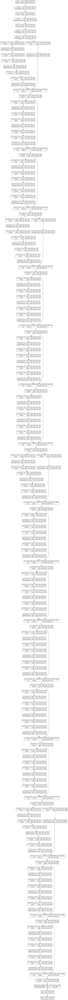

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_adam, 'model_adam_summary.png', show_shapes=True)

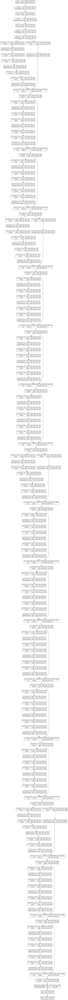

In [ ]:
plot_model(model_adadelta, 'model_adadelta_summary.png', show_shapes=True)

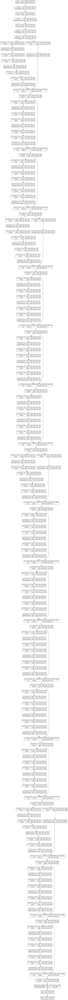

In [ ]:
plot_model(model_adagrad, 'model_adagrad_summary.png', show_shapes=True)

### Penjelasan

* **model.summary()**, fungsi yang digunakan untuk print summary dari layer dan parameter yang digunakan pada model. 
* **plot_model(model, 'model_summary.png', show_shapes=True)**, digunakan untuk membuat representasi visual dari summary dengan library **plot_model()** yang ada pada tensorflow. 
* **show_shapes=True**, merupakan parameter yang memberitahukan fungsi plot_model untuk membuat shapes pada setiap layer di plot. 

# **6. Save dan Load Model**

**-> Menyimpan Model**

In [ ]:
model_adam.save('adam-keras-resnet50.h5')

In [ ]:
model_adadelta.save('adadelta-keras-resnet50.h5')

In [ ]:
model_adagrad.save('adagrad-keras-resnet50.h5')

**-> Load Model**

In [ ]:
model = load_model('adam-keras-resnet50.h5')

# **7. Mencoba Model pada Gambar Sampel**

## Membaca dan sorting Data Test-Sample

In [ ]:
# Mendapatkan label dari dataset yang di train sebelumnya
labels = image_dataset_from_directory(directory=train_data_path).class_names

# Mendapatkan path dari sampel yang akan di tes di folder 'test-sample'
test_data_path = os.path.join(data_path, 'test-sample')

# Membuat list gambar yang akan di tes
images_paths = [os.path.join(test_data_path, file) 
                  for file in os.listdir(test_data_path)]
images_paths.sort()
images = [Image.open(image) for image in images_paths]

# Mendapatkan nama gambar
images_names = [image_path.split('/')[-1] for image_path in images_paths]

Found 5109 files belonging to 10 classes.


### Penjelasan

* **labels = image_dataset_from_directory(directory=train_data_path).class_names** , baris ini digunakan untuk membuat list dari nama class (atau label) dengan membaca direktori folder train. 
* **test_data_path = os.path.join(data_path, 'test-sample')** , baris ini digunakan untuk mendapatkan path/direktori dari folder test data. Dimana test data yang digunakan ada pada folder test-sample. 
* **images_paths = [os.path.join(test_data_path, file) for file in os.listdir(test_data_path)]** , baris ini membuat list path dari gambar yang ada pada direktori dengan menggabungkan direktori test_data_path dengan masing-masing nama dari file yang ada pada test_data_path
* **images_paths.sort()** , baris ini melakukan sorting list dari path gambar dengan urutan *ascending*
* **images = [Image.open(image) for image in images_paths]** , baris ini membuka gambar dengan menggunakan path yang sudah gambar yang sudah dibuat sebelumnya, dan membuat list dari gambar dengan menggunakan **Python Imaging Library (PIL)**
* **images_names = [image_path.split('/')[-1] for image_path in images_paths]** , baris ini membuat list dari nama gambar dengan memisahkan path dari image dibagian '/' dan mengambil elemen terakhir dari elemen yang didapat. 

## Membuat Fungsi untuk Memproses Gambar Test

In [ ]:
def process_images(images):
    """ 
    Mendapatkan list gambar, memproses setiap gambar pada list,
    lalu mengkonversikannya ke numpy array, 
    dan mengembalikannya dalam bentuk list
    """    
    images_as_arrays2 = []
    for img in images:
        x = img_to_array(img)[:,:,:3]  # Menghilangkan channel ke 4
        x = resize(x, (224, 224))
        x = preprocess_input(x)    
        images_as_arrays2.append(x)
    return images_as_arrays2

images_as_arrays = process_images(images) # == image_as_arrays2

### Penjelasan

Fungsi yang dibuat disini, secara umum erfungsi untuk mengampil gambar sebagai input dan mengubahnya menjadi list dari variabel numpy array, mengubah ukurannya menjadi 224x224, dan mengaplikasikan preprocessing step yang ada pada ResNet5

* **img_to_array(img)[:,:,:3]** , merupakan fungsi yang digunakan untuk mengambil gambar sebagai input, dan mengubahnya menjadi data dengan tipe data 3D numpy array, dengan bentuk (tinggi, lebar, channels). Dimana channels adalah jumlah dari channel warna, biasanya adalah 3 untuk gambar RGB. Inilah kenapa pada [tinggi, lebar, channels], tinggi nya bisa bernilai dari infiniti ke infiniti, lebarnya infiniti, tetapi channels hanya sampai dengan 3.
* **resize(x, (224, 224))** , fungsi ini digunakan untuk mengubah gambar ke ukuran spesifik. disini kita menggunakan ukuran 224x224 piksel
* **preprocess_input()**, sebelum gambar dimasukan ke neural network, dicek, serta diklasifikasikan menggunakan model, gambar akan dinormalisasi dan distandarisasi sesuai dengan apa yang digunakan pada ResNet50

## Stacking dan Prediksi Gambar dengan Model

In [ ]:
# Membuat batch agar mendapatkan prediksi gambar
test_batch = np.stack(images_as_arrays)

# Mendapatkan probabilitas dari gambar yang diprediksi
pred_probs = model.predict(test_batch)

1/1 [==============================] - 2s 2s/step


### Penjelasan

* **np.stack()**,  fungsi di library NumPy yang berguna untuk menggabungkan array. **np.stack** akan membuat array baru dengan jumlah dimensi yang sama dengan input array
* **model.predict()**, fungsi yang digunakan untuk memprediksi output dengan menggunakan model yang sudah dilatih sebelumnya. Dimana **test_batch** menjadi data yang akan diujikan

## Membuat Fungsi Visualisasi Hasil

**-> Fungsi untuk Memvisualisasikan Prediksi Gambar**

In [ ]:
def plot_pred(images, images_names, pred_probs, labels, n=1):
    """
    Menampilkan gambar dan prediksi dari gambar di image list
    """    

    # Mendapatkan probabilitas dan gambar dari sampel n
    pred_prob, image = pred_probs[n], images[n]

    # Mendapatkan label yang diprediksi
    pred_label = labels[np.argmax(pred_prob)]

    # Plot gambar 
    plt.imshow(image)

    # Merubah title dari plot menjadi label yang diprediksi dan probabilitas dari prediksi yang dihasilkan
    plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}%")
    plt.xlabel(images_names[n]) 

### Penjelasan

Fungsi ini mengambil 5 argumen, yaitu:
* **images** : list gambar
* **image_names** : list dari nama gambar
* **pred_probs** : list dari probabilitas prediksi dari setiap gambar di **images**
* **n** : argumen optional yang menspesifikasikan index yang akan ditampilkan

Pada  **pred_prob, image = pred_probs[n], images[n]** akan memasukkan nilai **pred_probs[n]** ke variabel **pred_prob[n]** dan **images[n]** ke variabel image

Pada **pred_label = labels[np.argmax(pred_prob)]** akan menyimpan label dengan probabilitas prediksi tertinggi. Hal ini dilakukan dengan menggunakan **np.argmax(pred_prob)**, suatu fungsi yang akan mendapatkan indeks dari prediksi yang memiliki probabilitas tertinggi. Index yang didapatkan kemudian dimasukkan ke **label[]** untuk mendapatkan label yang sesuai, sesuai dengan index.

Fungsi **imshow()** hanya akan menampilkan gambarnya, tetapi **plt.title()** akan menambahkan title yang berisikan label de dengan probabilitas tertinggi **{pred_label}** dan persentase probabilitas tersebut **{np.max(pred_prob)*100:2.0f}%**

Sedangkan **plt.xlabel()** hanya akan menampilkan nama file dari file yang diujikan di axis X.

**-> Fungsi untuk Plotting Probabilitas Hasil Prediksi dengan Confidence Index**

In [ ]:
def plot_pred_conf(pred_probs, labels, images_names=False, n=1):
    """
    Plot predicted probabilities along with the label for sample n
    """    
    # Mendapatkan probabilitas dari prediksi yang dihasilkan untuk sampel n
    pred_prob = pred_probs[n]

    # Mendapatkan label yang diprediksi
    pred_label = labels[np.argmax(pred_prob)]

    # Mencari confidence index dari prediksi
    pred_indexes = pred_prob.argsort()[::-1]
    
    # Mencari confidence values dari prediksi
    pred_values = pred_prob[pred_indexes]
    
    # Mencari label prediksi
    pred_labels = np.array(labels)[pred_indexes]

    # Mengatur plot
    top_plot = plt.bar(np.arange(len(pred_labels)),
                     pred_values,
                     color="grey")
    plt.xticks(np.arange(len(pred_labels)),
             labels=pred_labels,
             rotation="vertical")    

    # Merubah warna dari label jika image_names bisa diubah
    if images_names:
        true_label = images_names[n].split('_')[0]
        top_plot[np.argmax(pred_labels == true_label)].set_color("green")

### Penjelasan

Fungsi ini akan mengambil 4 argumen, yaitu:
* **pred_probs** : probabilitas prediksi dari model
* **labels** : list dari label
* **images_names** : boolean value (True or False) yang digunakan untuk menentukan apakah warna label bisa diubah atau tidak

Seperti yang dijelaskan sebelumnya, **pred_probs** merupakan list dari probabilitas prediksi dari setiap gambar di **images** dan **labels[np.argmax(pred_prob)]** akan menyimpan label dengan probabilitas prediksi tertinggi. Hal ini dilakukan dengan menggunakan **np.argmax(pred_prob)**, suatu fungsi yang akan mendapatkan indeks dari prediksi yang memiliki probabilitas tertinggi.

Tetapi pada fungsi ini, indeks hasil prediksi diurutkan dari yang memiliki probabilitas terbesar ke yang terkecil dengan **pred_prob.argsort()[::-1]**. Indeks ini kemudian digunakan untuk mendapatakan label prediksi dari probabilitasnya yang paling tinggi hingga terendah dengan **pred_values = pred_prob[pred_indexes]**

Lalu untuk mengatur plot yang akan dibuat, plt.bar dan plt.xticks digunakan, dimana:
* **plt.bar**, membuat bar dengan nilai x dan y diberikan, dimana disini  x adalah **pred_values** dan y adalah **pred_labels**
* **np.arrange(len(pred_labels))** akan membuat plot yang sejumlah label yang ada pada **pred_labels** dengan membuat plot bar dengan tinggi sebesar nilai **pred_values** dari masing-masing label. bar yang dibuat secara umum akan berwarna abu-abu dengan parameter color="grey"
* **plt.xticks** akan menyusun label pada axis X sesuai dengan nama yang akan ada pada pred_labels dan merotasikannya secara vertikal

Lalu baris kode terakhir akan membuat bar berwarna hijau jika probabilitas predikisinya memiliki nilai tertinggi dengan **set_color("green")**

## Visualisasi Hasil

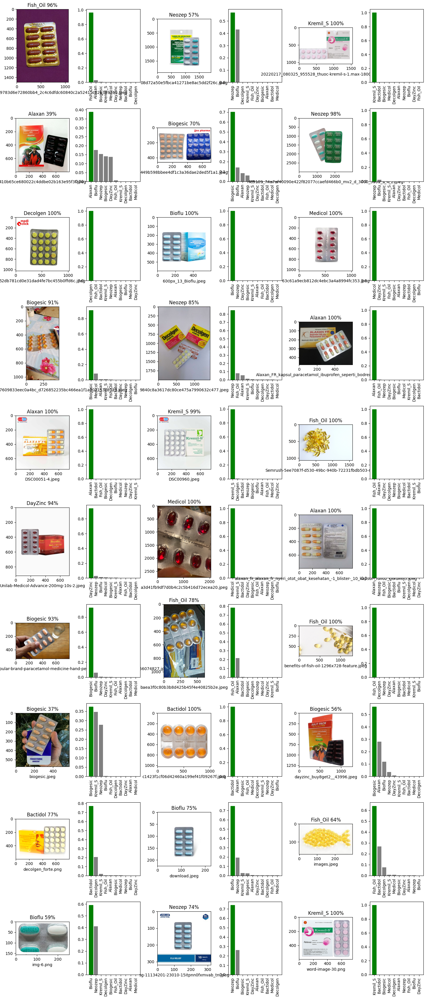

In [ ]:
num_rows = 10
num_cols = 3
num_images = num_rows * num_cols
plt.figure(figsize=(5 * num_cols, 3.5 * num_rows))
for i in range(num_images):
    if i < len(images) and i < len(images_names) and i < len(pred_probs):
        plt.subplot(num_rows, 2 * num_cols, 2*i+1)
        plot_pred(images, images_names, pred_probs, labels, i)
        plt.subplot(num_rows, 2*num_cols, 2*i+2)
        plot_pred_conf(pred_probs, labels, images_names, i)

plt.tight_layout(h_pad=1)
plt.show()


### Penjelasan

Kode ini secara umum digunakan untuk melakukan visualisasi dengan fungsi-fungsi yang sudah dibuat sebelumnya, seperti **plot_pred()** dan **plot_pred_conf()**. 

variabel seperti **num_rows** dan **num_cols** dibuat untuk menetapkan jumlah baris dan kolom, dan **num_images** adalah total dari gambar yang akan diplotting. 

**plt.figure()**, adalah fungsi yang digunakan sebagai container dari gambar-gambar plotting yang akan ditampilkan, dimana ukurannya adalah 5 pixel untuk setiap kolom (**num_cols**) dan 3.5 pixel untuk setiap baris (**num_rows**)

Karena perhitungan array pada python dimulai dari 0, maka jumlah index elemen akan selalu (jumlah total elemen)-1 dan ini juga alasan kenapa menggunakan  **if i < len(images) and i < len(images_names) and i < len(pred_probs)** untuk mengecek apakah data (jumlah gambar, jumlah nama gambar, dan jumlah hasil prediksi) yang akan ditampilkan masih ada di dalam rentang index untuk diproses di **For-loop**. 

Pada **For-loop**, terdapat fungsi **plt.subplot()** digunakan untuk membuat subplot. Dimana parameter pertama adalah jumlah baris dan paramter kedua adalah jumlah kolom, dimana **2 * num_cols** karena dalam 1 gambar terdapat 2 subplot, yaitu gambar yang diprediksi serta hasil dari prediksinya. Lalu parameter **2 * i + 1** adalah ekspresi yang digunakan untuk menghitung indeks pada subplot. Karena terdapat 2 subplot dalam 1 gambar, i akan dikali dengan 2 dan ditambahkan 1 untuk mendapatkan index dari subplot gambar saat ini. 

In [ ]:
%watermark -a "Astrid Annisa Purwaningtyas (2006485913)" -d -t -p os,random,time,copy,matplotlib.pyplot,np,PIL.Image,tensorflow,tensorflow.config,list_physical_devices,tensorflow.image,tensorflow.keras.utils,tensorflow.keras.applications.resnet50,preprocess_input,tensorflow.keras,Sequential,Model,Input,layers,optimizers,losses,callbacks,load_model


Author: Astrid Annisa Purwaningtyas (2006485913)

os                                    : unknown
random                                : unknown
time                                  : unknown
copy                                  : unknown
matplotlib.pyplot                     : unknown
np                                    : not installed
PIL.Image                             : 8.4.0
tensorflow                            : 2.12.0
tensorflow.config                     : unknown
list_physical_devices                 : not installed
tensorflow.image                      : unknown
tensorflow.keras.utils                : unknown
tensorflow.keras.applications.resnet50: unknown
preprocess_input                      : not installed
tensorflow.keras                      : 2.12.0
Sequential                            : not installed
Model                                 : not installed
Input                                 : not installed
layers                                : not installed
